# **IMPORTING NECESSAY LIBRARIES**

In [1]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import cv2
import random
import numpy as np
import skimage as ski
import seaborn as sns
from skimage.color import rgb2gray
from skimage import io, color, filters, feature
from scipy.stats import mode
from scipy import stats
from PIL import Image
import os
import shutil
from tqdm import tqdm
import math
from skimage import exposure

# **ABOUT DIABETIC RETINOPATHY**

![Example Image](https://www.raleighop.com/wp-content/uploads/Diabetic-Retina-768x352.jpg)


# Non-proliferative diabetic retinopathy

Non-proliferative diabetic retinopathy (NPDR) is the early stage of the disease in which symptoms will be mild or nonexistent. In NPDR, the blood vessels in the retina are weakened. Tiny bulges in the blood vessels, called microaneurysms, may leak fluid into the retina. This leakage may lead to swelling of the macula.

# Proliferative diabetic retinopathy

Proliferative diabetic retinopathy (PDR) is the more advanced form of the disease. At this stage, circulation problems deprive the retina of oxygen. As a result, new, fragile blood vessels can begin to grow in the retina and into the vitreous, the gel-like fluid that fills the back of the eye. The new blood vessels may leak blood into the vitreous, clouding vision.

Other complications of PDR include detachment of the retina due to scar tissue formation and the development of glaucoma. Glaucoma is an eye disease in which there is progressive damage to the optic nerve. In PDR, new blood vessels grow into the area of the eye that drains fluid from the eye. This greatly raises the eye pressure, which damages the optic nerve. If left untreated, PDR can cause severe vision loss and even blindness.

Reference: "Diabetic retinopathy" https://www.aoa.org/healthy-eyes/eye-and-vision-conditions/diabetic-retinopathy?sso=y

So how we can detect Non-proliferative diabetic retinopathy and Proliferative diabetic retinopathy is very important. Especially, if we miss Proliferative diabetic retinopathy, it may cause very serious problem. And if we miss the early stage symptoms, it may cause the delay of prevention.

The data set has 5 classes, "Health", "Mild", "Moderate", "Proliferate" and "Severe". But to get high score by simplifying the data, in this notebook, I classified the data into 3 classes, "Healthy", "Caution" (Mild and Moderate), and "Severe"(Proliferate and Severe).

# **ABOUT DATASET**

## There are a total of 6185 images ,we collected image from the roboflow universe of datasets

<style>
    table {
        width: 200%; /* Adjust the width percentage as needed */
    }
</style>


| **Class**  | **Count** |
|------------|-----------|
| NO_dR      | 3251      |
| PROLIFERATE| 484       |
| MILD       | 588       |
| SEVERE     | 315       |
| MODERATE   | 1547      |


In [31]:
dataset_dir = '/kaggle/input/dataset2/ds_dataset'

In [13]:
def is_noisy(image, threshold=100):
    if not isinstance(image, np.ndarray):
        image = np.array(image)
    # Convert the image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    # Calculate the variance of pixel intensities
    variance = cv2.Laplacian(gray_image, cv2.CV_64F).var()
    # Check if the variance exceeds the threshold
    if variance > threshold:
        return True  # Image is noisy
    else:
        return False  # Image is not noisy



In [14]:
def inspect_dataset(dataset_folder):
    class_folders = os.listdir(dataset_folder)

    # Initialize variables to store inspection results
    inconsistent_sizes = []
    blurry_images = []
    noisy_images = []
    class_counts = {}

    for class_folder in class_folders:
        class_path = os.path.join(dataset_folder, class_folder)
        if os.path.isdir(class_path):
            images = os.listdir(class_path)
            class_counts[class_folder] = len(images)

            for image_file in images:
                image_path = os.path.join(class_path, image_file)
                try:
                    # Open the image using PIL
                    img = Image.open(image_path)
                    # Check for inconsistent sizes
                    if img.size not in inconsistent_sizes:
                        inconsistent_sizes.append(img.size)
                    # Check for blurry images (using variance of Laplacian method)
                    lap_var = cv2.Laplacian(np.array(img), cv2.CV_64F).var()
                    if lap_var < 100:
                        blurry_images.append(image_path)
                    # Check for noisy images (example method)
                    # Replace this with the appropriate method for your noise detection
                    noisy = is_noisy(img)
                    if noisy:
                        noisy_images.append(image_path)
                except Exception as e:
                    print(f"Error processing {image_path}: {str(e)}")
    print("Inconsistent image sizes:", inconsistent_sizes)
#     print("Blurry images:", len(blurry_images))
#     print("Noisy images:", len(noisy_images))
    print("Class counts:", class_counts)

In [6]:
inspect_dataset(dataset_dir)

Inconsistent image sizes: [(224, 224)]
Class counts: {'Mild': 294, 'Proliferate_DR': 217, 'Moderate': 766, 'No_DR': 1430, 'Severe': 131}


In [25]:
class_folders = os.listdir(dataset_dir)
print(class_folders)

['Mild', 'Proliferate_DR', 'Moderate', 'No_DR', 'Severe']


## DATA ANALYSIS AND VISUALIZATION

5


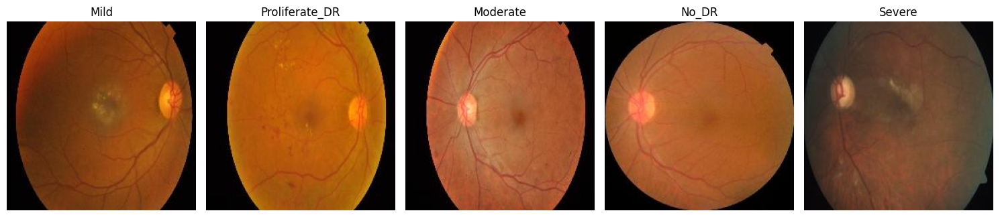

In [34]:
# Get the list of class directories
class_names = os.listdir(dataset_dir)

# Calculate the number of rows and columns for subplots
num_classes = len(class_names)
num_rows = 1
num_cols = num_classes

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5))
image_paths_list=[]
# Iterate through each class directory
for i, class_name in enumerate(class_names):
    class_dir = os.path.join(dataset_dir, class_name)
    image_paths = [os.path.join(class_dir, img_name) for img_name in os.listdir(class_dir)]
    random_img_path = random.choice(image_paths)
    random_img_path = image_paths[2]
    image_paths_list.append(image_paths)
    # Load and display the random image
    img = cv2.imread(random_img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB (OpenCV reads in BGR)

    # Show the image in the subplot
    ax = axes[i]
    ax.imshow(img)
    ax.set_title(class_name)
    ax.axis('off')
print(len(image_paths_list))
plt.tight_layout()
plt.show()


In [14]:
directory = "/kaggle/input/dataset2/ds_dataset"
image_data = []
labels = []
for class_name in os.listdir(directory):
    class_dir = os.path.join(directory, class_name)
    if os.path.isdir(class_dir):
        for filename in os.listdir(class_dir):
            if filename.endswith(".jpg") or filename.endswith(".png"):
                img = cv2.imread(os.path.join(class_dir, filename))
                image_data.append(img)
                labels.append(class_name)

image_data = np.array(image_data)
labels = np.array(labels)
print("Image dataset shape:", image_data.shape)
print("Labels shape:", labels.shape)

Image dataset shape: (2838, 224, 224, 3)
Labels shape: (2838,)


In [15]:
mean_val = np.mean(image_data)
median_val = np.median(image_data)
mode_val = mode(image_data, axis=None)[0]
print(mean_val)
print(median_val)
print(mode_val)

60.70403695786696
46.0
0


### PIXEL VALUE DISTRIBUTION MEAN,MEDIAN AND MODE

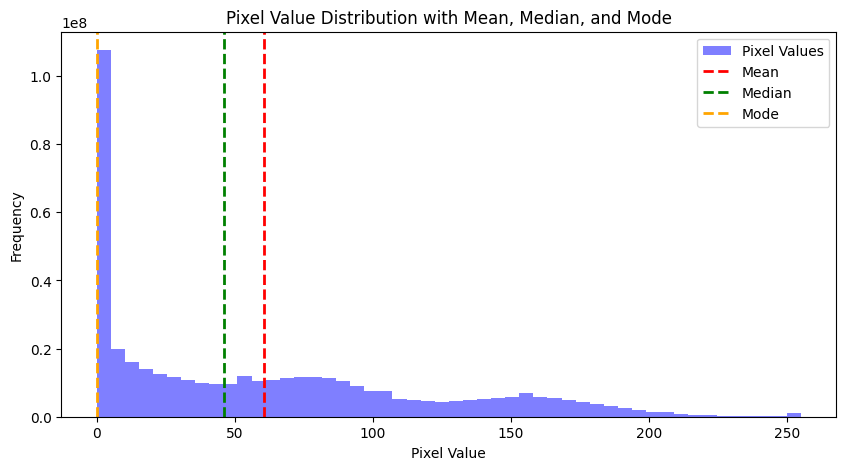

In [16]:
plt.figure(figsize=(10, 5))
plt.hist(image_data.flatten(), bins=50, color='blue', alpha=0.5, label='Pixel Values')
plt.axvline(mean_val, color='red', linestyle='dashed', linewidth=2, label='Mean')
plt.axvline(median_val, color='green', linestyle='dashed', linewidth=2, label='Median')
plt.axvline(mode_val, color='orange', linestyle='dashed', linewidth=2, label='Mode')
plt.legend()
plt.title('Pixel Value Distribution with Mean, Median, and Mode')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.show()

### OUTLIERS DETECTION

Outlier Indices: [   0    0    0 ... 2837 2837 2837]


/opt/conda/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


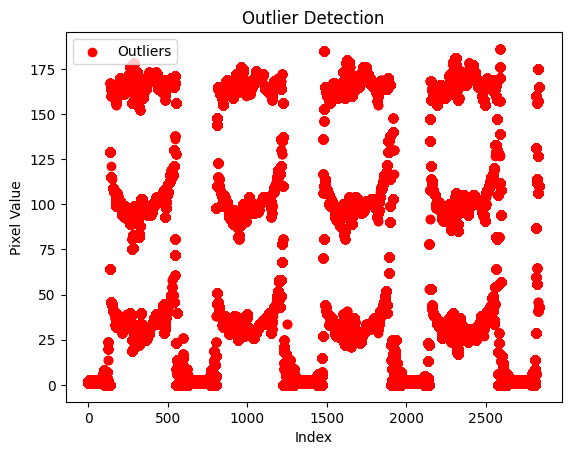

In [17]:
# Calculate Z-score
z_scores = stats.zscore(image_data)

# Define a threshold for outlier detection (e.g., 3 standard deviations)
threshold = 3

# Find outlier indices
outlier_indices = np.where(np.abs(z_scores) > threshold)[0]  # Use [0] to get the indices directly

# Print outlier indices
print("Outlier Indices:", outlier_indices)

# Select the corresponding outlier values from image_data
outlier_values = np.take(image_data, outlier_indices)

# Visualize outliers
plt.scatter(outlier_indices, outlier_values, color='red', label='Outliers')
plt.legend()
plt.title('Outlier Detection')
plt.xlabel('Index')
plt.ylabel('Pixel Value')
plt.show()

### CALUCLATING BASIC STATS

In [18]:
def calculate_basic_statistics(dataset_dir):
    class_names = os.listdir(dataset_dir)
    num_images_per_class = []
    image_dimensions = []

    for class_name in class_names:
        class_dir = os.path.join(dataset_dir, class_name)
        image_paths = [os.path.join(class_dir, img_name) for img_name in os.listdir(class_dir)]
        num_images_per_class.append(len(image_paths))

        # Get dimensions of sample image
        sample_img = cv2.imread(image_paths[0])
        height, width, _ = sample_img.shape
        image_dimensions.append((height, width))

    return num_images_per_class, image_dimensions

In [19]:
num_images_per_class, image_dimensions = calculate_basic_statistics(dataset_dir)
total_images = sum(num_images_per_class)
num_classes = len(num_images_per_class)

print("Basic Statistics:")
print(f"Total number of images: {total_images}")
print(f"Number of classes: {num_classes}")
print(f"Number of images per class: {num_images_per_class}")
print(f"Image dimensions (height, width): {image_dimensions}")

Basic Statistics:
Total number of images: 2838
Number of classes: 5
Number of images per class: [294, 217, 766, 1430, 131]
Image dimensions (height, width): [(224, 224), (224, 224), (224, 224), (224, 224), (224, 224)]


### ADJUSTING BRIGHTNESS AND CONTRAST

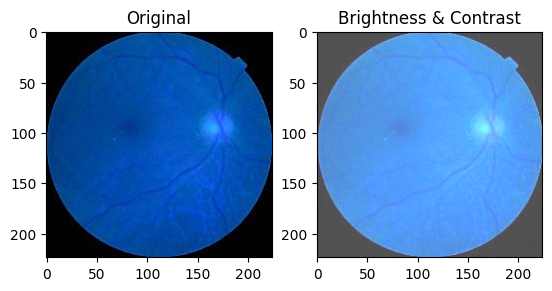

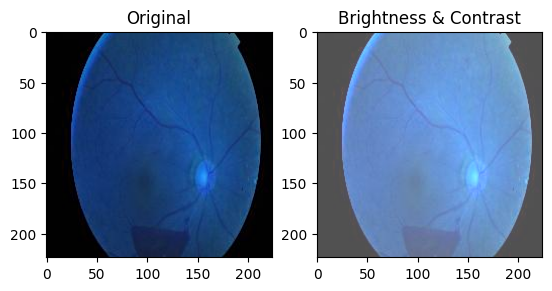

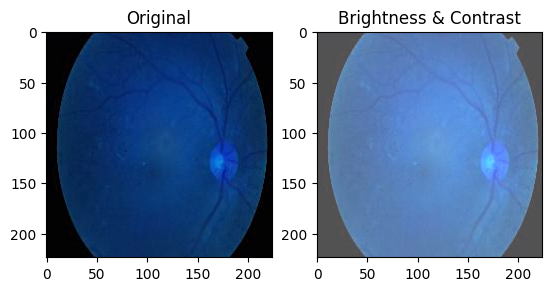

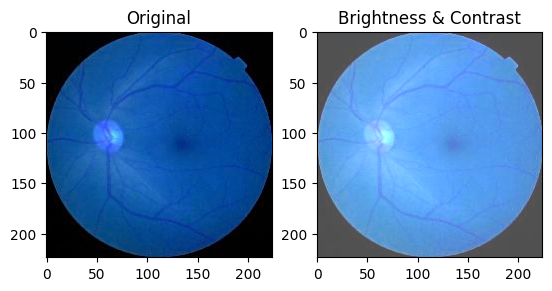

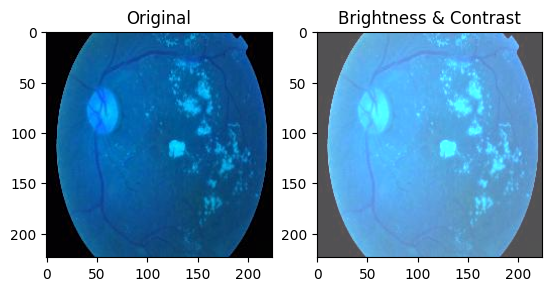

In [20]:
for class_path in image_paths_list:
      # Load an image (replace 'GFG.jpeg' with your image path)
      image = cv2.imread(class_path[5])

      # Adjust brightness and contrast
      brightness = 80
      contrast = 1.0
      image2 = cv2.addWeighted(image, contrast, np.zeros(image.shape, image.dtype), 0, brightness)

      # Save the modified image
      cv2.imwrite('modified_image.jpg', image2)

      # Display original and modified images
      plt.subplot(1, 2, 1)
      plt.title("Original")
      plt.imshow(image)

      plt.subplot(1, 2, 2)
      plt.title("Brightness & Contrast")
      plt.imshow(image2)
      plt.show()

### CONVERTING TO GRAYSCALE AND EQUALIZING THE HISTOGRAM

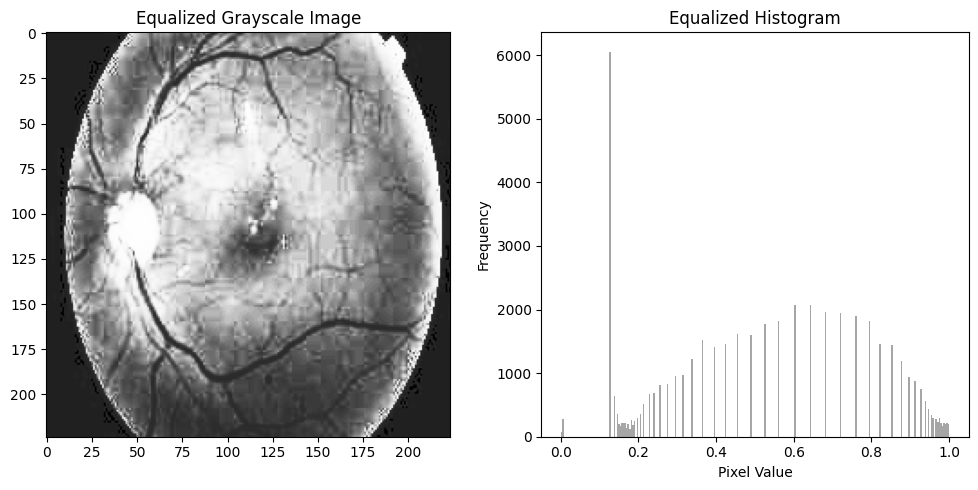

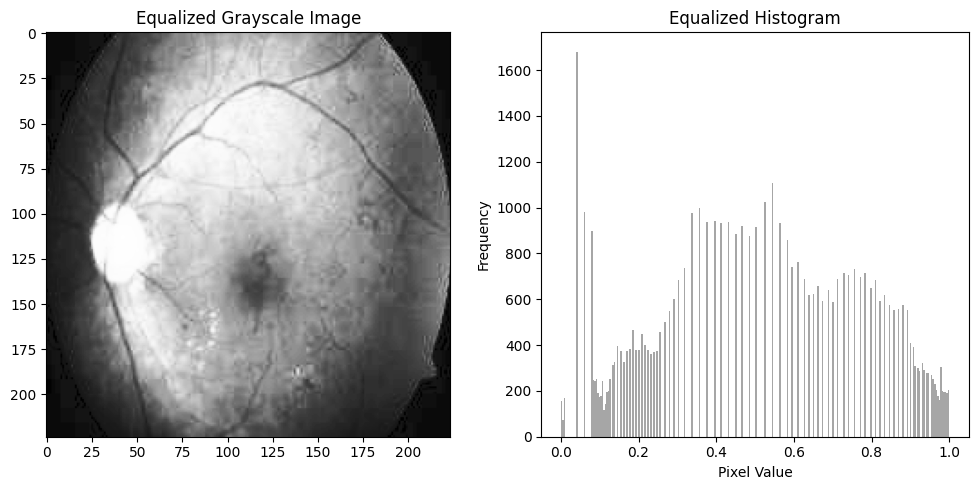

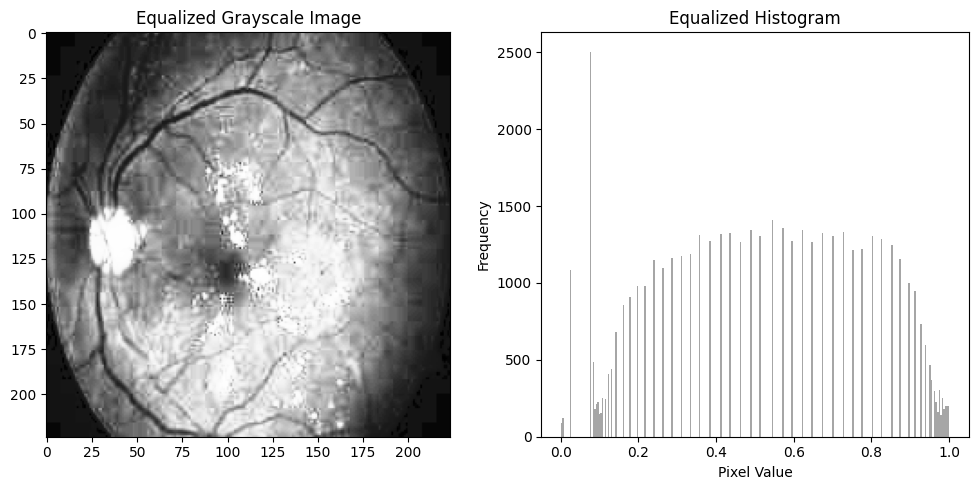

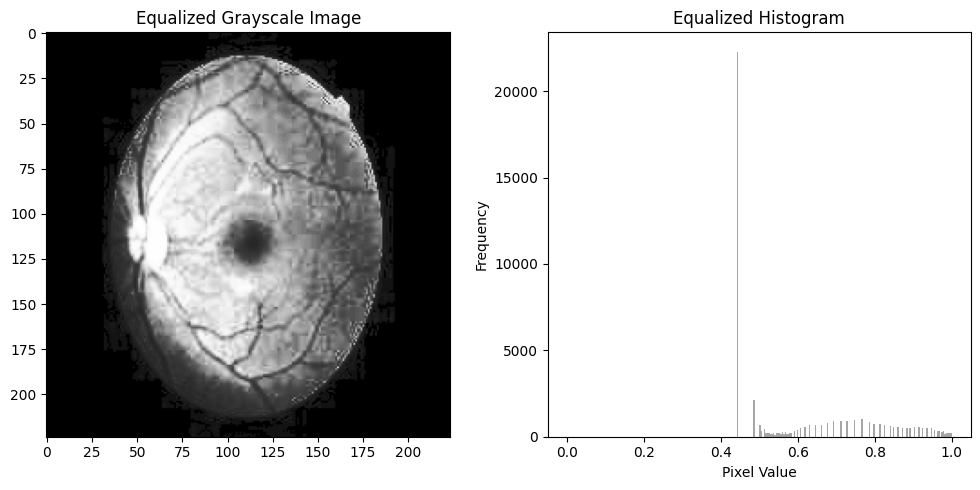

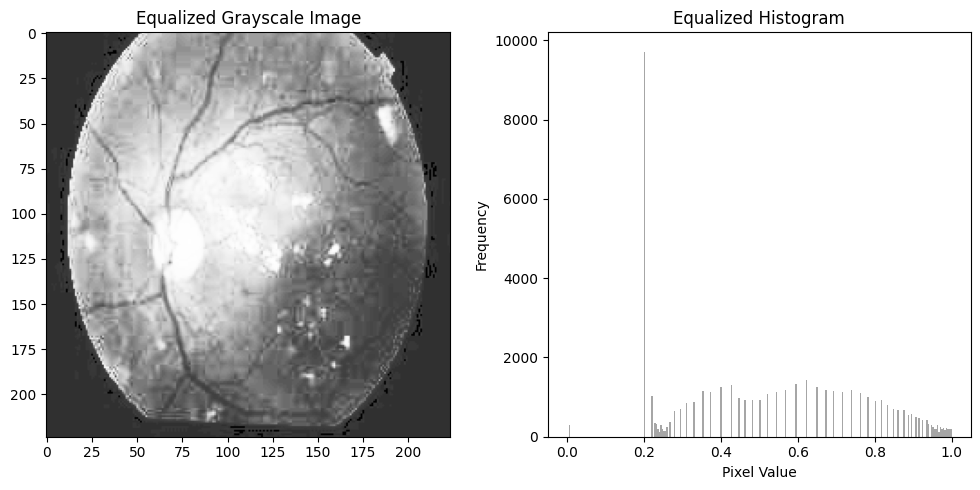

In [21]:
from PIL import Image
import matplotlib.pyplot as plt
from skimage import exposure

def rgb_to_gray(rgb_image):
    # Convert the image to grayscale
    gray_image = rgb_image.convert('L')
    return gray_image
for class_path in image_paths_list:
    rgb_image = Image.open(class_path[0]) # Open the RGB image
    gray_image = rgb_to_gray(rgb_image) # Convert the RGB image to grayscale
    gray_image_array = np.array(gray_image) # Convert PIL Image to NumPy array
    gray_image_eq_array = exposure.equalize_hist(gray_image_array) # Equalize the histogram of the grayscale image
    gray_image_eq = Image.fromarray((gray_image_eq_array * 255).astype(np.uint8)) # Convert NumPy array back to PIL Image
    plt.figure(figsize=(10, 5))# Display the grayscale image
    plt.subplot(1, 2, 1)
    plt.imshow(gray_image_eq, cmap='gray')
    plt.title('Equalized Grayscale Image')
    plt.subplot(1, 2, 2)
    plt.hist(gray_image_eq_array.flatten(), bins=256, range=(0, 1), color='gray', alpha=0.7)
    plt.title('Equalized Histogram')
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')
    plt.tight_layout()
    plt.show()


### HEAT MAP AND PIXEL INTENSITY

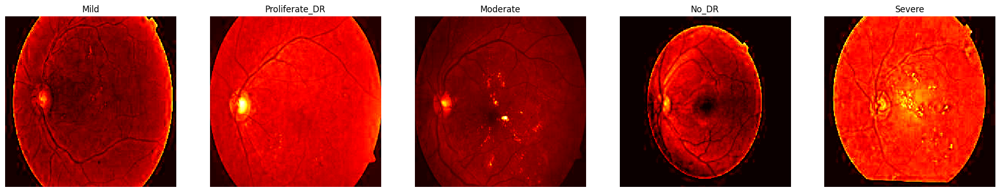

In [22]:
i=0
fig, axes = plt.subplots(1, 5, figsize=(25, 5))
for class_path in image_paths_list:
    img=plt.imread(class_path[0])
    axes[i].imshow(img[:, :, 2], cmap='hot', interpolation='nearest')
    axes[i].set_title(class_names[i])
    axes[i].axis('off')  # Hide axis labels
    i=i+1

plt.show()

### CANNY EDGE DETECTION AND GAUSSIAN BLUR

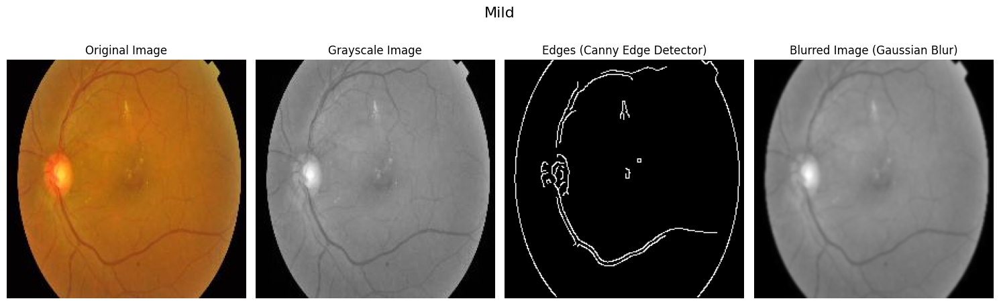

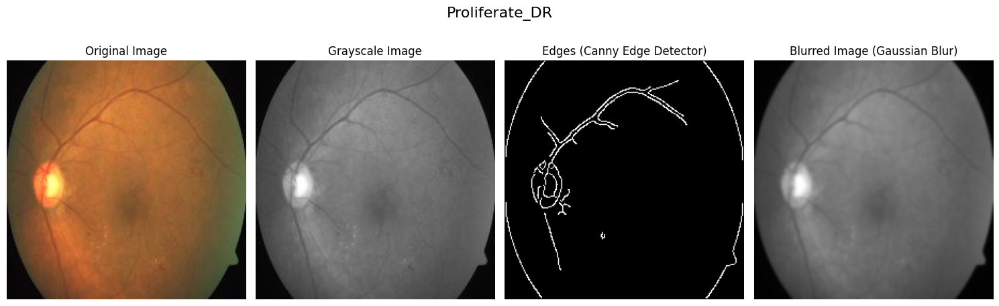

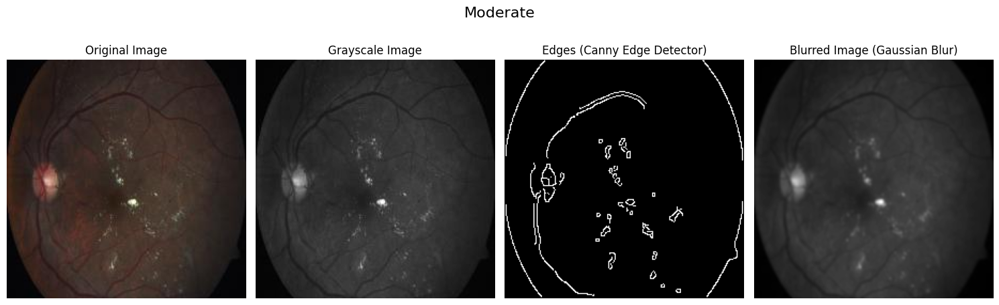

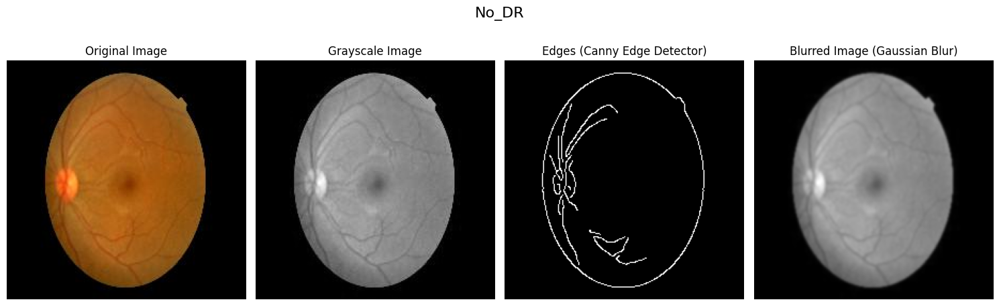

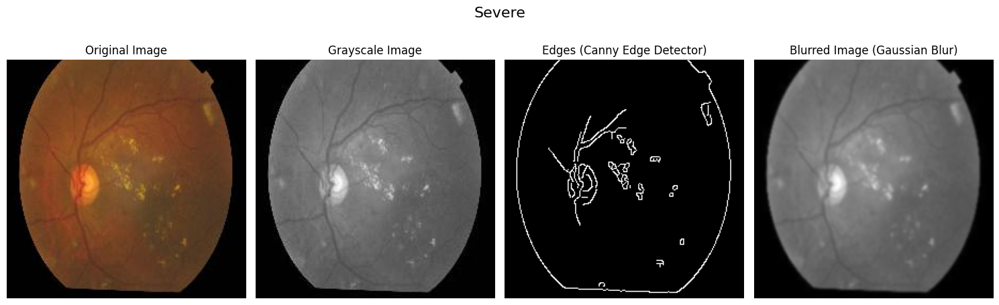

In [23]:

def process_and_display_image(image, title):
    gray_image = color.rgb2gray(image)
    edges = feature.canny(gray_image, sigma=1)
    blurred_image = filters.gaussian(gray_image, sigma=1)
    plt.figure(figsize=(15, 5))

    # Plot the original image
    plt.subplot(1, 4, 1)
    plt.imshow(image)
    plt.title("Original Image")
    plt.axis("off")

    # Plot the grayscale image
    plt.subplot(1, 4, 2)
    plt.imshow(gray_image, cmap="gray")
    plt.title("Grayscale Image")
    plt.axis("off")

    # Plot the edges
    plt.subplot(1, 4, 3)
    plt.imshow(edges, cmap="gray")
    plt.title("Edges (Canny Edge Detector)")
    plt.axis("off")

    # Plot the blurred image
    plt.subplot(1, 4, 4)
    plt.imshow(blurred_image, cmap="gray")
    plt.title("Blurred Image (Gaussian Blur)")
    plt.axis("off")

    # Set the overall title for the entire plot
    plt.suptitle(title, fontsize=16)

    # Adjust layout and display the plot
    plt.tight_layout()
    plt.show()


i=0
for class_path in image_paths_list:
    process_and_display_image(io.imread(class_path[0]),class_names[i])
    i=i+1


## STATISTICAL ANALYSIS:

### Mean, Median, and Standard Deviation

/opt/conda/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/conda/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


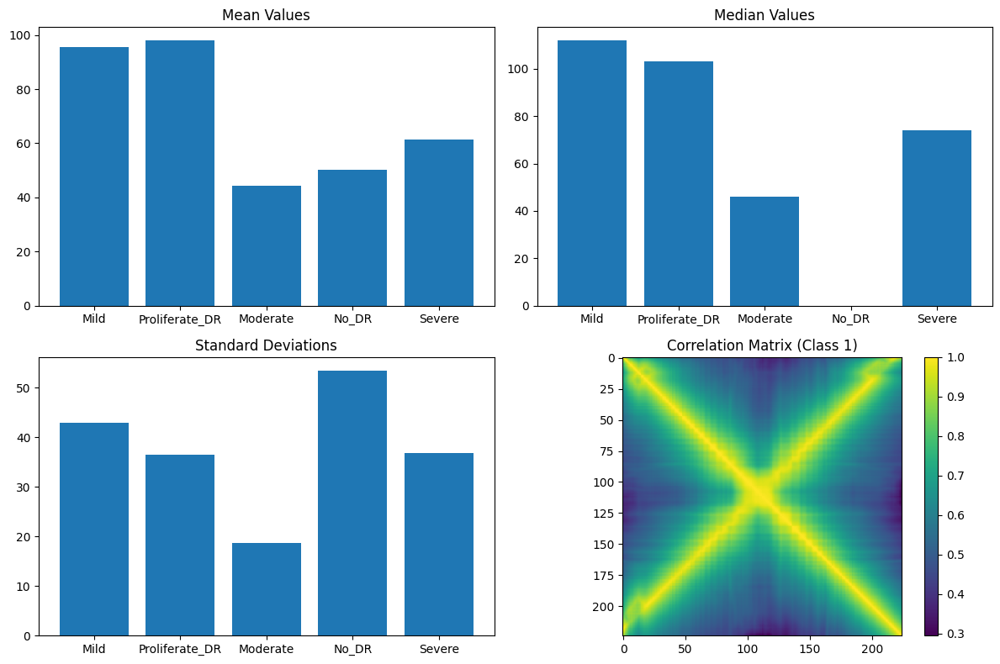

In [24]:
mean_values = []
median_values = []
std_deviations = []
correlation_matrices = []

for class_path in image_paths_list:
    image = cv2.imread(class_path[0], cv2.IMREAD_GRAYSCALE)
    mean_value = np.mean(image)
    median_value = np.median(image)
    std_deviation = np.std(image)
    correlation_matrix = np.corrcoef(image)
    mean_values.append(mean_value)
    median_values.append(median_value)
    std_deviations.append(std_deviation)
    correlation_matrices.append(correlation_matrix)
mean_values = np.array(mean_values)
median_values = np.array(median_values)
std_deviations = np.array(std_deviations)

plt.figure(figsize=(12, 8))

# Mean values
plt.subplot(2, 2, 1)
plt.bar(np.arange(len(mean_values)), mean_values, tick_label=class_names)
plt.title('Mean Values')

# Median values
plt.subplot(2, 2, 2)
plt.bar(np.arange(len(median_values)), median_values, tick_label=class_names)
plt.title('Median Values')

# Standard deviations
plt.subplot(2, 2, 3)
plt.bar(np.arange(len(std_deviations)), std_deviations, tick_label=class_names)
plt.title('Standard Deviations')

# Correlation matrices (showing just one element for simplicity)
plt.subplot(2, 2, 4)
plt.imshow(correlation_matrices[0], cmap='viridis')
plt.colorbar()
plt.title('Correlation Matrix (Class 1)')

plt.tight_layout()
plt.show()


### VISUALIZATION OF PIXEL INTENSITY DISTRIBUTION 

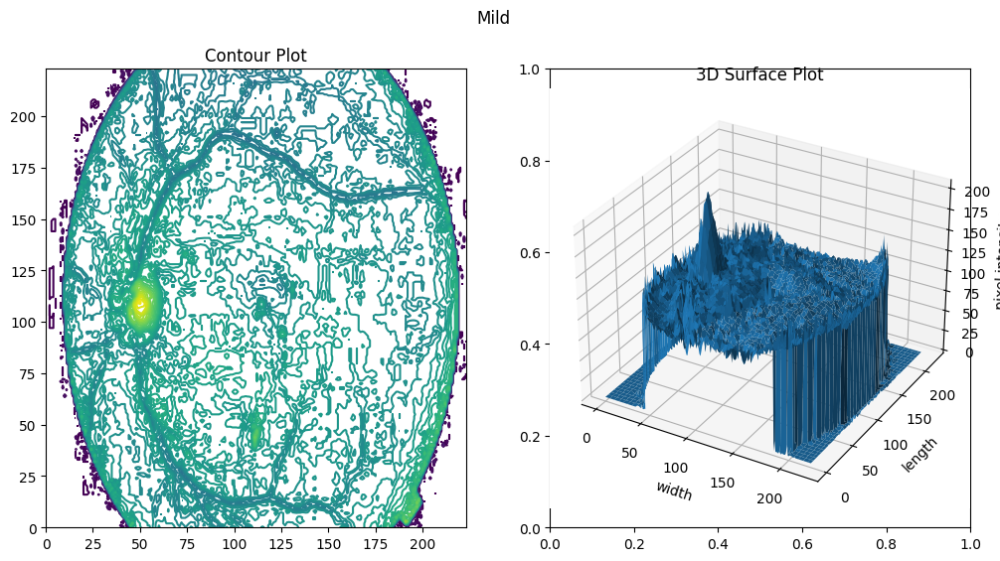

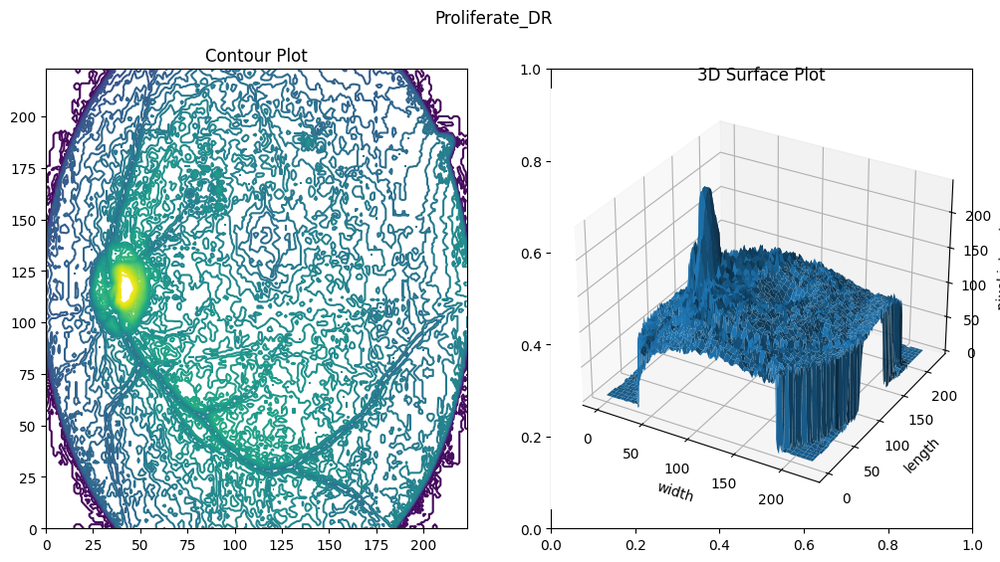

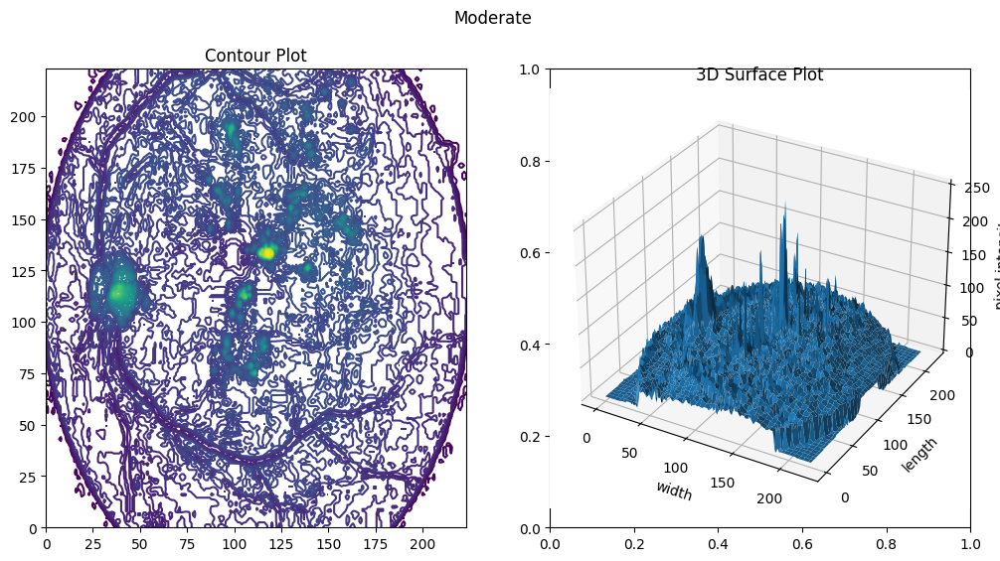

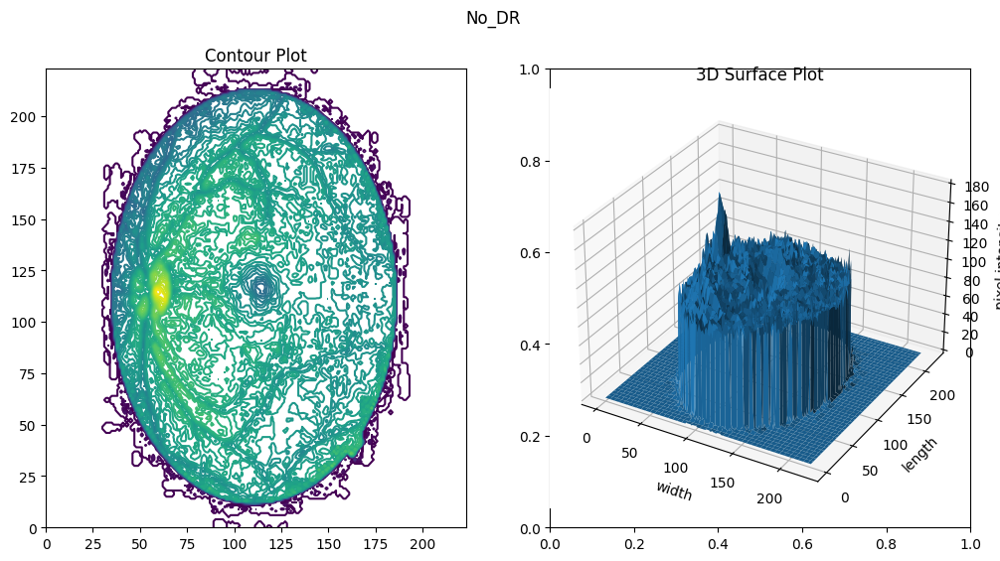

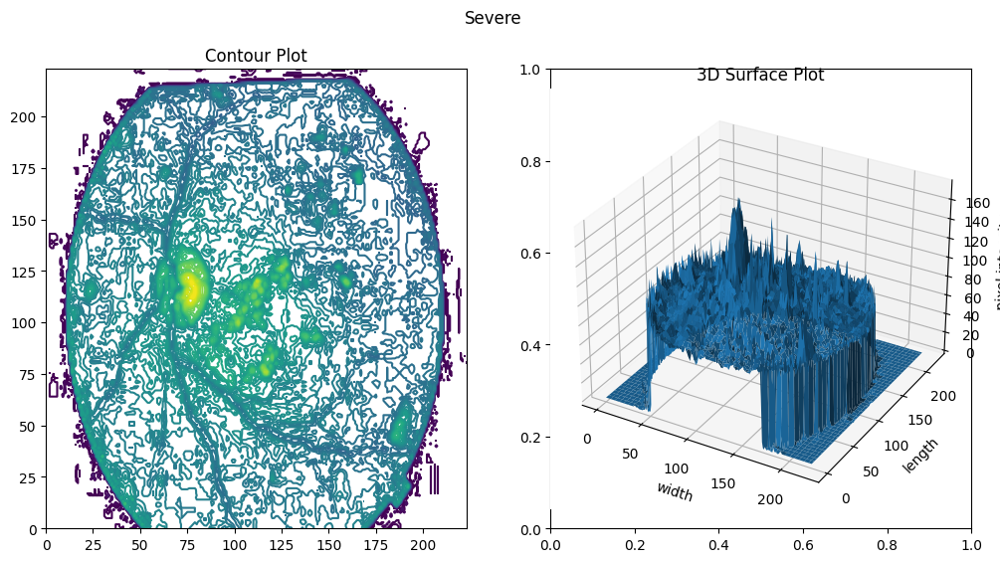

In [25]:
i=0
for class_path in image_paths_list:
    img=plt.imread(class_path[0])
    imlab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    axes[0].contour(imlab[:,:,0], 50)
    axes[0].set_title('Contour Plot')
    ax = axes[1] if len(axes) > 1 else axes
    ax = ax if isinstance(ax, Axes3D) else fig.add_subplot(1, 2, 2, projection='3d')
    ax.set_xlabel('width')
    ax.set_ylabel('length')
    ax.set_zlabel('pixel intensity')
    ax.plot_surface(*np.meshgrid(range(imlab.shape[1]), range(imlab.shape[0])), imlab[:,:,0])
    ax.set_title('3D Surface Plot')
    plt.suptitle(class_names[i])
    plt.show()
    i=i+1



### GRAYSCALE IMAGES USING HEAT MAP

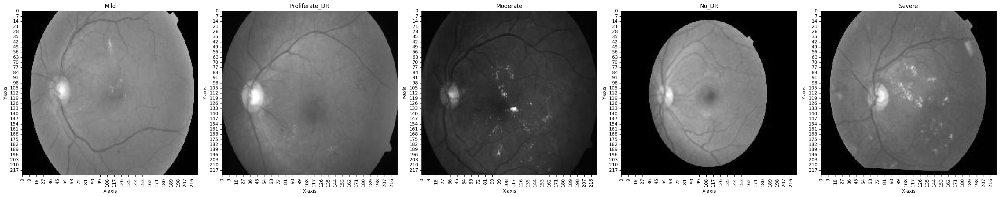

In [26]:
i=0
fig, axes = plt.subplots( 1,5, figsize=( 6 * 5,6))
for class_path in image_paths_list:
    image_data = plt.imread(class_path[0])
    grayscale_image = rgb2gray(image_data)
    sns.heatmap(grayscale_image, cmap='gray', cbar=False, ax=axes[i])
    axes[i].set_title(class_names[i])
    axes[i].set_xlabel('X-axis')
    axes[i].set_ylabel('Y-axis')
    i=i+1
plt.tight_layout()
plt.show()


# DATA PREPROCESSING

### SHARPNESS ANHANCEMENT

This function, canny(image), aims to enhance the edges within an image using the Canny edge detection algorithm. In the first step, the algorithm identifies edges by analyzing changes in pixel intensity, marking them as white while other areas remain black. Next, these detected edges are intensified to make them more prominent, helping to highlight important features within the image. Finally, the function ensures that the pixel intensities fall within a valid range and converts the data type of the image for compatibility, resulting in a sharpened image where edges are accentuated for clearer visualization and analysis.

In [6]:
def canny2(image,low,high):
#     gray_image = color.rgb2gray(image)
    edges = cv2.Canny(image, low, high) 
    return edges

In [7]:
def canny(image):
    edges = cv2.Canny(image, 80, 120)  # You can adjust the threshold values
    sharpened_image=image+ (3*edges)
    sharpened_image = np.clip(sharpened_image, 0, 255).astype(np.uint8)
    return sharpened_image

###  GRAY SCALE



The function grayscale(image) is a simple preprocessing technique commonly used in diabetic retinopathy analysis to convert a color image into grayscale. This conversion simplifies the image by removing color information and retaining only the luminance or intensity values, which are crucial for identifying structural abnormalities in retinal images. By using the OpenCV function cv2.cvtColor(), the image is transformed from the RGB color space to the grayscale color space. This conversion reduces the computational complexity of subsequent image processing tasks while preserving important features such as blood vessel structures, exudates, and lesions, facilitating more accurate analysis and diagnosis of diabetic retinopathy. Overall, grayscale conversion serves as a fundamental preprocessing step in diabetic retinopathy analysis, enhancing the efficiency and effectiveness of subsequent image processing and analysis algorithms.

In [8]:
def grayscale(image):
    gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    return gray_image

### CIRCULAR CROP


The function crop_image_from_gray(img, tol=7) crops out dark regions from grayscale or RGB images. It creates a mask based on pixel intensity thresholds, then crops the image accordingly. For grayscale images, it directly applies the mask, while for RGB images, it first converts them to grayscale, applies the mask, and then reconstructs the cropped RGB image. This function is useful for preprocessing images in tasks like diabetic retinopathy analysis.

In [9]:

def crop_image_from_gray(img,tol=7):
    if img.ndim ==2:
        mask = img>tol
        return img[np.ix_(mask.any(1),mask.any(0))]
    elif img.ndim==3:
        gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        mask = gray_img>tol
        
        check_shape = img[:,:,0][np.ix_(mask.any(1),mask.any(0))].shape[0]
        if (check_shape == 0): # image is too dark so that we crop out everything,
            return img # return original image
        else:
            img1=img[:,:,0][np.ix_(mask.any(1),mask.any(0))]
            img2=img[:,:,1][np.ix_(mask.any(1),mask.any(0))]
            img3=img[:,:,2][np.ix_(mask.any(1),mask.any(0))]
    #         print(img1.shape,img2.shape,img3.shape)
            img = np.stack([img1,img2,img3],axis=-1)
    #         print(img.shape)
        return img


The circle_crop(img, sigmaX=10) function crops the input image into a circular shape centered at its center. It calculates the circle's parameters based on the image dimensions, creates a binary mask representing the circular region, and applies this mask to the input image to preserve only the circular area. Optionally, it further processes the cropped image, such as by removing dark regions using crop_image_from_gray() and resizing it to a standard size (224x224). This function is particularly useful for tasks requiring circular cropping, such as in image-based analyses where irrelevant background information needs to be eliminated.

In [10]:
def circle_crop(img, sigmaX=10):
    height, width, depth = img.shape

    x = int(width/2)
    y = int(height/2)
    r = np.amin((x,y))

    circle_img = np.zeros((height, width), np.uint8)
    cv2.circle(circle_img, (x,y), int(r), 1, thickness=-1)
    img = cv2.bitwise_and(img, img, mask=circle_img)
    img = crop_image_from_gray(img)
#     img=cv2.addWeighted ( img,4, cv2.GaussianBlur( img , (0,0) , sigmaX) ,-4 ,128)
    img = cv2.resize(img,(224,224))
    return img

### BEN GRAHAM TECHNIQUE


The ben(image) function performs preprocessing on the input image, commonly used in tasks like diabetic retinopathy analysis. It first crops out dark regions using crop_image_from_gray(), ensuring that only relevant features are retained. Next, it resizes the cropped image to a standard size of 224x224 pixels. Finally, it applies a technique called Brightness Enhancement Normalization (BEN), which enhances the image's contrast and brightness. This is achieved by adding a weighted combination of the image and its Gaussian blurred version, adjusting the balance between sharpness and smoothness. The resulting image is more suitable for subsequent analysis or classification tasks, particularly in medical imaging where accurate feature extraction is crucial for diagnosis.

In [11]:
def ben(image):
#     image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    image = crop_image_from_gray(image)
    image = cv2.resize(image, (224, 224))
    image=cv2.addWeighted (image,4, cv2.GaussianBlur( image , (0,0) , 10) ,-4 ,128)
    return image

### BRIGHTNESS AND CONTRAST

As images we recieve may be taken vrying lightening sources adjusting there brightness and contrast is usefull and required preprocessing technque

In [12]:
def B_C(image):
        brightness = 80
        contrast = 1.0
        image_b_c = cv2.addWeighted(image, contrast, np.zeros(image.shape, image.dtype), 0, brightness)
        return image_b_c

### GABOUR FILTER

The gabour(img) function applies Gabor filtering, a technique commonly used in image processing for feature extraction and texture analysis. It initializes an empty image with the same dimensions as the input image and iterates over specified orientations (0, 45, and 90 degrees) to create Gabor kernels. These kernels are essentially convolutional filters designed to capture different frequency and orientation patterns present in the image. The function then applies these Gabor filters to the input image using the OpenCV function cv2.filter2D(). After processing, the filtered image is scaled to the uint8 range for proper visualization and returned as the output. 

In [13]:
def gabour(img):
    # Define the orientations you want to capture
    orientations = [0, np.pi/4, np.pi/2]  # Horizontal and diagonal orientations

    # Initialize an empty image with the same shape as the input
    filtered_img = np.zeros_like(img, dtype=np.float32)

    for theta in orientations:
        sigma = 1.99  # Standard deviation of the Gaussian envelope
        lambda_ = 9.8  # Wavelength of the sinusoidal factor
        gamma = 6.08  # Spatial aspect ratio
        phi = 0  # Phase offset

        # Generate Gabor filter
        gabor_kernel = cv2.getGaborKernel((21, 21), sigma, theta, lambda_, gamma, phi, ktype=cv2.CV_32F)

        # Apply Gabor filter and add it to the filtered image
        filtered_img += cv2.filter2D(img, cv2.CV_32F, gabor_kernel)  # Use CV_32F to keep precision

    # Scale the filtered image to the uint8 range
    filtered_img_scaled = (filtered_img - filtered_img.min()) / (filtered_img.max() - filtered_img.min()) * 255
    filtered_img_uint8 = np.clip(filtered_img_scaled, 0, 255).astype(np.uint8)

    return filtered_img_uint8

### EQUALIZATION OF HISTOGRAM


In [14]:
#histogram eq
def eq_hist(img):
    
    # Apply histogram equalization
    img_equalized = cv2.equalizeHist(img)

    return img_equalized

## VERIFYING EACH PREPROCESSING TECHNIQUE

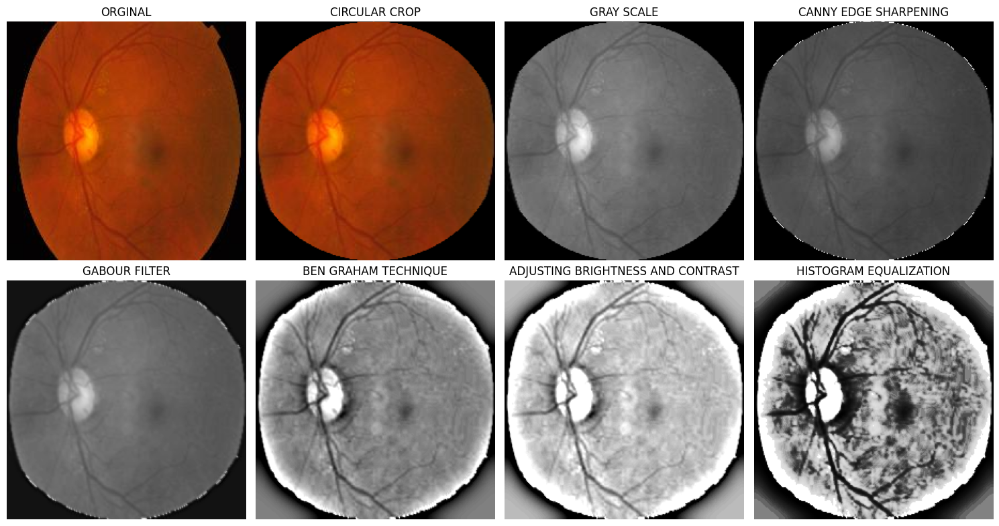

In [15]:
import cv2

# Load the image
image_org = cv2.imread('/kaggle/input/dataset2/ds_dataset/Mild/05a5183c92d0_png.rf.f15dba59da0c14e13e34338ef5602d11.jpg',)
image_org = cv2.cvtColor(image_org, cv2.COLOR_BGR2RGB)
image1=image_org

image2=circle_crop(image_org)
image3 = grayscale(image2)
image4=canny(image3)
image5=gabour(image4)
image6=ben(image5)
image7=B_C(image6)
image8=eq_hist(image7)
# Resize the image
# image=eq_hist(image)

plt.figure(figsize=(15,8))

plt.subplot(2,4,1)
plt.imshow(image1)
plt.title("ORGINAL")
plt.axis("off")

plt.subplot(2,4,2)
plt.imshow(image2, cmap='gray')
plt.title("CIRCULAR CROP")
plt.axis("off")

plt.subplot(2,4,3)
plt.imshow(image3,cmap='gray')
plt.title("GRAY SCALE")
plt.axis("off")

plt.subplot(2,4,4)
plt.imshow(image4, cmap='gray')
plt.title("CANNY EDGE SHARPENING")
plt.axis("off")

plt.subplot(2,4,5)
plt.imshow(image5,cmap='gray')
plt.title("GABOUR FILTER")
plt.axis("off")

plt.subplot(2,4,6)
plt.imshow(image6, cmap='gray')
plt.title("BEN GRAHAM TECHNIQUE")
plt.axis("off")

plt.subplot(2,4,7)
plt.imshow(image7,cmap='gray')
plt.title("ADJUSTING BRIGHTNESS AND CONTRAST")
plt.axis("off")

plt.subplot(2,4,8)
plt.imshow(image8, cmap='gray')
plt.title("HISTOGRAM EQUALIZATION")
plt.axis("off")


# Display the resized image
plt.tight_layout()
plt.show()


## *APPLYING SELECTED PREPROCESSING TECHNIQUE TO EACH IMAGE*

In [16]:
def preprocess_image(image_path, target_size=(224, 224)):
    """
    Preprocesses an image by resizing and normalizing.

    Args:
        image_path (str): Path to the input image file.
        target_size (tuple): Target size for resizing the image.

    Returns:
        np.ndarray: Preprocessed image as a NumPy array with shape (height, width, channels).
    """
    # Load the image
    image_org = cv2.imread(image_path)
    
    # converting default BGR to RGB format
    image = cv2.cvtColor(image_org, cv2.COLOR_BGR2RGB)
    
    #cropping the image
    image = circle_crop(image)
    
    #converting to gray scale
    image=grayscale(image)

   # Enhancing the sharpness of the using canny edge detection and adding extra layers
    image= canny(image)
    
    #ben graham
#     image = ben(image)
    
    #Brightness and contrast
#     image=B_C(image)

    # Using gabour filter
    image= gabour(image)
    
#     ben graham
#     image = ben(image)
    
    #equalization of histogram
#     image = eq_hist(image)

    # Resize the image
    resized_image = cv2.resize(image, target_size)

    # Normalize pixel values to the range [0, 1]
    normalized_image = resized_image.astype(np.float32) / 255.0

    return normalized_image

## *This function take each image from the existing image folder and preprocess them ,store them in a new location with same structure as the parent directory*

In [17]:

def process_directory(source_dir, target_dir):
    """
    Processes all images in the source directory and saves the preprocessed images in the target directory.

    Args:
        source_dir (str): Path to the source directory containing the images.
        target_dir (str): Path to the target directory where the preprocessed images will be saved.
    """
    # Create the target directory if it doesn't exist
    os.makedirs(target_dir, exist_ok=True)

    
    # Iterate over subdirectories (e.g., train, val, test)
    for subdir in os.listdir(source_dir):
        subdir_path = os.path.join(source_dir, subdir)
        target_subdir_path = os.path.join(target_dir, subdir)

        # Create the target subdirectory
        os.makedirs(target_subdir_path, exist_ok=True)

        # Iterate over class directories
        for class_dir in os.listdir(subdir_path):
            class_path = os.path.join(subdir_path, class_dir)
            target_class_path = os.path.join(target_subdir_path, class_dir)

            # Create the target class directory
            os.makedirs(target_class_path, exist_ok=True)

            # Iterate over images in the class directory
            for image_file in tqdm(os.listdir(class_path), desc=f"Processing {class_dir}"):
                image_path = os.path.join(class_path, image_file)
                target_image_path = os.path.join(target_class_path, image_file)

                # Preprocess the image
                preprocessed_image = preprocess_image(image_path)

                # Save the preprocessed image
                cv2.imwrite(target_image_path, preprocessed_image * 255)  # Multiply by 255 to convert back to uint8

# Example usage
source_dir = '/kaggle/input/ds-final-dataset/Detection-Of-Diabetic-Retinopathy-Using-Machine-Learning--1/Detection-Of-Diabetic-Retinopathy-Using-Machine-Learning--1'
target_dir = '/kaggle/working/preprocess_dir_1'

process_directory(source_dir, target_dir)

Processing Severe: 100%|██████████| 252/252 [00:06<00:00, 41.15it/s]


# MODEL TESTING

### *Making train ,test and validation datasets using tensorflow flow from from directory function*

In [19]:
import tensorflow as tf

# Define paths to the train, validation, and test directories
train_dir = '/kaggle/working/preprocess_dir_1/train'
validation_dir = '/kaggle/working/preprocess_dir_1/valid'
test_dir = '/kaggle/working/preprocess_dir_1/test'

# Define the image size and batch size
img_height = 224
img_width = 224
batch_size = 32

# Create datasets for training, validation, and testing
train_ds = tf.keras.utils.image_dataset_from_directory(
    train_dir,
    image_size=(img_height, img_width),
    batch_size=batch_size
)

val_ds = tf.keras.utils.image_dataset_from_directory(
    validation_dir,
    image_size=(img_height, img_width),
    batch_size=batch_size
)

test_ds = tf.keras.utils.image_dataset_from_directory(
    test_dir,
    image_size=(img_height, img_width),
    batch_size=batch_size
)

2024-04-11 08:52:30.381019: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-11 08:52:30.381140: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-11 08:52:30.544758: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Found 5094 files belonging to 5 classes.
Found 731 files belonging to 5 classes.
Found 360 files belonging to 5 classes.


In [20]:
for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(32, 224, 224, 3)
(32,)


### *Standardize the data*

In [21]:
normalization_layer = tf.keras.layers.Rescaling(1./255)

In [22]:
normalized_ds = train_ds.map(lambda x, y: (normalization_layer(x), y))
image_batch, labels_batch = next(iter(normalized_ds))
first_image = image_batch[0]
print(np.min(first_image), np.max(first_image))

0.0 1.0


In [23]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [24]:
import tensorflow as tf
from tensorflow.keras.layers import Dense
from tensorflow.keras.models import Model
from tensorflow.keras.applications import EfficientNetB3,VGG16,ResNet50 
from tensorflow.keras.applications.efficientnet import preprocess_input
from tensorflow.keras.models import Model
from tensorflow.keras.layers import BatchNormalization, Dense, Dropout,Flatten,Conv2D, MaxPooling2D
from tensorflow.keras.callbacks import EarlyStopping

In [25]:
num_classes = 5

In [39]:
import tensorflow as tf
from keras.utils import plot_model
from IPython.display import Image

def visualize_added_layers(base_model, model):
    """
    Visualize the added layers to a base model.
    
    Args:
        base_model (tf.keras.Model): The base model.
        model (tf.keras.Model): The final model with added layers.
    """
    # Create a temporary directory to store the plot
    import tempfile
    tmp_dir = tempfile.mkdtemp()
    
    # Get the layers only present in the final model
    base_model_layers = set([layer.name for layer in base_model.layers])
    final_model_layers = set([layer.name for layer in model.layers])
    added_layers = [layer for layer in model.layers if layer.name not in base_model_layers]
    
    # Create a new model with only the added layers
    inputs = model.inputs
    outputs = [layer.output for layer in added_layers]
    added_layers_model = tf.keras.Model(inputs=inputs, outputs=outputs)
    
    # Plot the added layers model
    added_layers_path = f"{tmp_dir}/added_layers.png"
    plot_model(added_layers_model, to_file=added_layers_path, show_shapes=True, show_layer_names=True)
    
    # Display the plot
    print("Added Layers:")
    Image(filename=added_layers_path)

In [27]:
def prepare_model(base_model_fn, input_shape=(224, 224, 3), num_classes=5):
    base_model = base_model_fn(weights='imagenet', include_top=False, input_shape=input_shape)
    for layer in base_model.layers:
        layer.trainable = False
    x = base_model.output
    x = tf.keras.layers.GlobalAveragePooling2D()(x)
    x = Dense(128, activation='relu')(x)
    x = Dropout(0.2)(x)
    x = Dense(128, activation='relu')(x)
    x = Dropout(0.2)(x)
    predictions = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    model.compile(
      optimizer='adam',
      loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
      metrics=['accuracy'])
#     model.summary()
    return model

In [28]:
import matplotlib.pyplot as plt

def plot_training_history(history, model_name):
    # Extract training and validation accuracy and loss
    tr_acc = history.history['accuracy']  
    tr_loss = history.history['loss']  
    v_acc = history.history['val_accuracy']  
    v_loss = history.history['val_loss']  

    # Find index of highest validation accuracy and lowest validation loss
    index_acc = np.argmax(v_acc)
    high_vacc = v_acc[index_acc]  
    index_loss = np.argmin(v_loss)
    low_vloss = v_loss[index_loss]  

    # Create range of epochs for plotting
    epochs = range(1, len(tr_acc) + 1)  

    # Format best epoch information
    best_acc = f'Best epoch = {index_acc + 1}'  
    best_loss = f'Best epoch = {index_loss + 1}'  

    # Create a figure with two subplots for accuracy and loss
    plt.figure(figsize=(16, 8))
    plt.style.use('fivethirtyeight')

    # Plot training and validation accuracy
    plt.subplot(1, 2, 1)
    plt.plot(epochs, tr_acc, "g", label="Train Accuracy")  
    plt.plot(epochs, v_acc, "r", label="Validation Accuracy")  
    plt.scatter(index_acc + 1, high_vacc, s=150, color='purple', label=best_acc)  
    plt.title(f"Accuracy: Train Vs Validation ({model_name})")
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Plot training and validation loss
    plt.subplot(1, 2, 2)
    plt.plot(epochs, tr_loss, "g", label="Train Loss")  
    plt.plot(epochs, v_loss, "r", label="Validation Loss")  
    plt.scatter(index_loss + 1, low_vloss, s=150, color='purple', label=best_loss)  
    plt.title(f"Loss: Train Vs Validation ({model_name})")
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    # Adjust layout and display the plot
    plt.tight_layout()
    plt.show()


In [29]:
import itertools
from sklearn.metrics import confusion_matrix
def plot_confusion_matrix(y_true, y_pred, classes,tittle):
    """
    Plot the confusion matrix.

    Args:
    - y_true: True labels.
    - y_pred: Predicted labels.
    - classes: List of class names.
    """
    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)

    # Create figure
    plt.figure(figsize=(10, 10))
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title(tittle)
    plt.colorbar()

    # Define tick marks
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    # Determine threshold for text color
    thresh = cm.max() / 2.

    # Add text annotations
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j], horizontalalignment='center', color='white' if cm[i, j] > thresh else 'black')

    # Add labels and adjust layout
    plt.tight_layout()
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()


In [30]:
def prepare_model_efficientnetb3():
    return prepare_model(EfficientNetB3)
def prepare_model_VGG16():
    return prepare_model(VGG16)
def prepare_model_ResNet50():
    return prepare_model(ResNet50)

## **EFFICIENT NET B3 MODEL**

In [47]:
model_en = prepare_model_efficientnetb3()
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

In [48]:
# Display model summary
model_en.summary()

Model: "functional_13"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_7         │ (None, 224, 224,  │          0 │ input_layer_3[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization_3     │ (None, 224, 224,  │          7 │ rescaling_7[0][0] │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_8         │ (None, 224, 224,  │          0 │ normalization_3[… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, 225, 225,  │          0 │ rescaling_8[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 112, 112,  │      1,080 │ stem_conv_pad[0]… │
│                     │ 40)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 112, 112,  │        160 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 40)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 112, 112,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 40)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, 112, 112,  │        360 │ stem_activation[… │
│ (DepthwiseConv2D)   │ 40)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, 112, 112,  │        160 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ 40)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, 112, 112,  │          0 │ block1a_bn[0][0]  │
│ (Activation)        │ 40)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_squeeze  │ (None, 40)        │          0 │ block1a_activati… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reshape  │ (None, 1, 1, 40)  │          0 │ block1a_se_squee… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reduce   │ (None, 1, 1, 10)  │        410 │ block1a_se_resha… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_expand   │ (None, 1, 1, 40)  │        440 │ block1a_se_reduc… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_excite   │ (None, 112, 112,  │          0 │ block1a_activati… │
│ (Multiply)          │ 40)               │            │ block1a_se_expan… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 112, 112,  │        960 │ block1a_se_excit

 Total params: 10,997,428 (41.95 MB)

 Trainable params: 213,893 (835.52 KB)

 Non-trainable params: 10,783,535 (41.14 MB)

In [49]:
history_en=model_en.fit(
          train_ds,
          validation_data=val_ds,
          epochs=20,
          callbacks=[early_stop]
        )

Epoch 1/20
  1/160 ━━━━━━━━━━━━━━━━━━━━ 2:50:39 64s/step - accuracy: 0.1250 - loss: 1.6866

I0000 00:00:1712826562.099761     100 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
W0000 00:00:1712826562.181429     100 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


160/160 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step - accuracy: 0.6564 - loss: 0.9422

W0000 00:00:1712826614.257093     102 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1712826623.363769     102 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1712826638.043837     100 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


160/160 ━━━━━━━━━━━━━━━━━━━━ 141s 479ms/step - accuracy: 0.6567 - loss: 0.9414 - val_accuracy: 0.7469 - val_loss: 0.6528
Epoch 2/20
160/160 ━━━━━━━━━━━━━━━━━━━━ 13s 81ms/step - accuracy: 0.7405 - loss: 0.6925 - val_accuracy: 0.7811 - val_loss: 0.5991
Epoch 3/20
160/160 ━━━━━━━━━━━━━━━━━━━━ 13s 81ms/step - accuracy: 0.7542 - loss: 0.6418 - val_accuracy: 0.7606 - val_loss: 0.5969
Epoch 4/20
160/160 ━━━━━━━━━━━━━━━━━━━━ 13s 81ms/step - accuracy: 0.7628 - loss: 0.6239 - val_accuracy: 0.7921 - val_loss: 0.5658
Epoch 5/20
160/160 ━━━━━━━━━━━━━━━━━━━━ 13s 81ms/step - accuracy: 0.7801 - loss: 0.5933 - val_accuracy: 0.7811 - val_loss: 0.5728
Epoch 6/20
160/160 ━━━━━━━━━━━━━━━━━━━━ 13s 82ms/step - accuracy: 0.7852 - loss: 0.5638 - val_accuracy: 0.7962 - val_loss: 0.5539
Epoch 7/20
160/160 ━━━━━━━━━━━━━━━━━━━━ 13s 81ms/step - accuracy: 0.7858 - loss: 0.5600 - val_accuracy: 0.7702 - val_loss: 0.6287
Epoch 8/20
160/160 ━━━━━━━━━━━━━━━━━━━━ 13s 81ms/step - accuracy: 0.7944 - loss: 0.5478 - val_accur

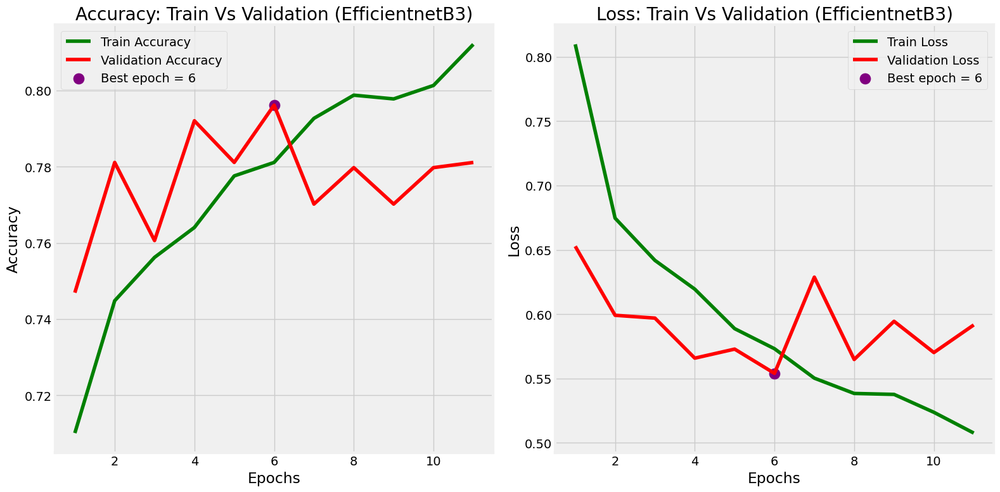

In [50]:
plot_training_history(history_en,'EfficientnetB3')

In [51]:
loss, accuracy = model_en.evaluate(test_ds)

print(f'Test Loss: {loss}')
print(f'Test Accuracy: {accuracy}')

12/12 ━━━━━━━━━━━━━━━━━━━━ 11s 951ms/step - accuracy: 0.8004 - loss: 0.6078
Test Loss: 0.6430702805519104
Test Accuracy: 0.7916666865348816


W0000 00:00:1712826821.100289     102 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


 3/12 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step

W0000 00:00:1712826829.649554     100 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


12/12 ━━━━━━━━━━━━━━━━━━━━ 18s 877ms/step


W0000 00:00:1712826839.292065     100 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


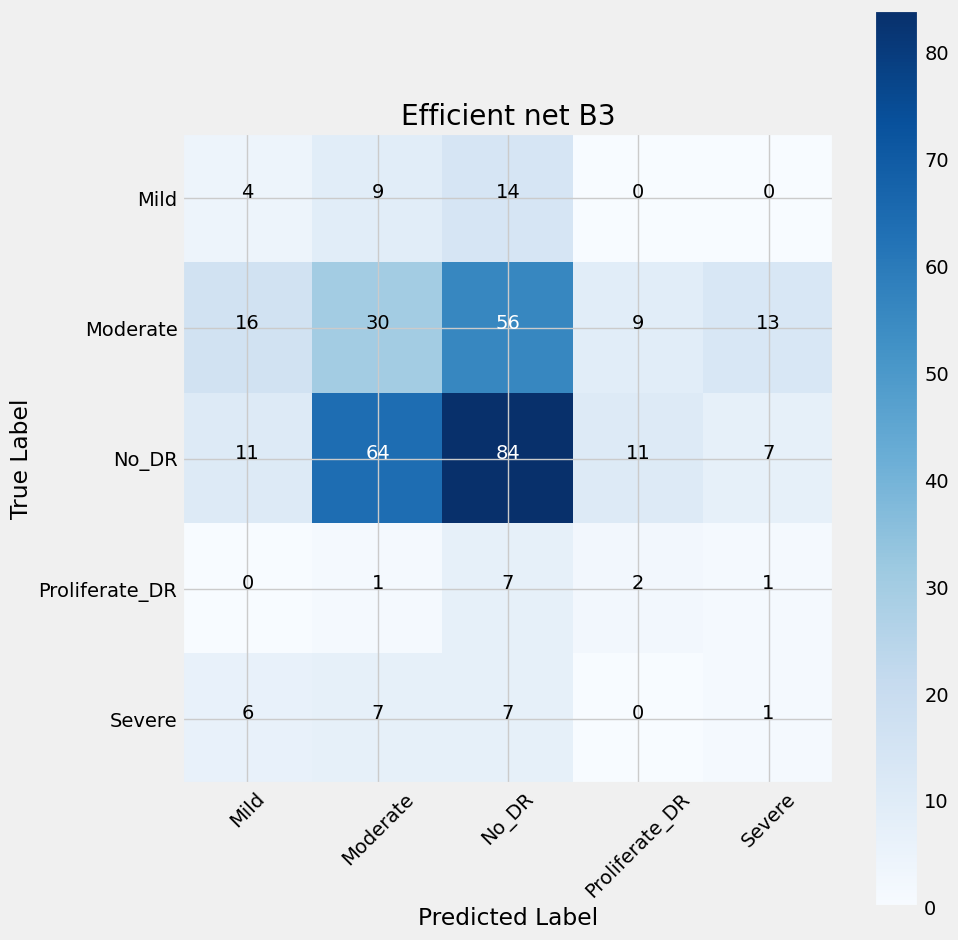

In [52]:
# Assuming you have trained your model and obtained predictions
preds = model_en.predict(test_ds)  # Use predict method instead of predict_generator
y_pred = np.argmax(preds, axis=1)  # Convert probabilities to class labels
y_true = np.concatenate([label.numpy() for _, label in test_ds])
 # True labels from the generator
classes = class_names = test_ds.class_names # Get class names from the generator
plot_confusion_matrix(y_pred,y_true,classes,'Efficient net B3')

## **VGG16 MODEL**

In [53]:
model_vg = prepare_model_VGG16()
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [54]:
model_vg.summary()

Model: "functional_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_3      │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 128)            │        65,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 14,797,509 (56.45 MB)

 Trainable params: 82,821 (323.52 KB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [55]:
history_vg=model_vg.fit(
          train_ds,
          validation_data=val_ds,
          epochs=20,
          callbacks=[early_stop]
        )

Epoch 1/20
  1/160 ━━━━━━━━━━━━━━━━━━━━ 1:30:56 34s/step - accuracy: 0.1562 - loss: 3.9471

W0000 00:00:1712826944.497996     102 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


160/160 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step - accuracy: 0.6062 - loss: 1.2620

W0000 00:00:1712826974.551416      99 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1712826975.484676      99 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1712827004.053181     102 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


160/160 ━━━━━━━━━━━━━━━━━━━━ 94s 375ms/step - accuracy: 0.6066 - loss: 1.2600 - val_accuracy: 0.7456 - val_loss: 0.6481
Epoch 2/20
160/160 ━━━━━━━━━━━━━━━━━━━━ 22s 140ms/step - accuracy: 0.7344 - loss: 0.7078 - val_accuracy: 0.7469 - val_loss: 0.6559
Epoch 3/20
160/160 ━━━━━━━━━━━━━━━━━━━━ 22s 139ms/step - accuracy: 0.7562 - loss: 0.6424 - val_accuracy: 0.7524 - val_loss: 0.6341
Epoch 4/20
160/160 ━━━━━━━━━━━━━━━━━━━━ 22s 139ms/step - accuracy: 0.7725 - loss: 0.5971 - val_accuracy: 0.7688 - val_loss: 0.5932
Epoch 5/20
160/160 ━━━━━━━━━━━━━━━━━━━━ 22s 139ms/step - accuracy: 0.7791 - loss: 0.5603 - val_accuracy: 0.7688 - val_loss: 0.6185
Epoch 6/20
160/160 ━━━━━━━━━━━━━━━━━━━━ 22s 139ms/step - accuracy: 0.8020 - loss: 0.5224 - val_accuracy: 0.7784 - val_loss: 0.5974
Epoch 7/20
160/160 ━━━━━━━━━━━━━━━━━━━━ 22s 140ms/step - accuracy: 0.8152 - loss: 0.4900 - val_accuracy: 0.7811 - val_loss: 0.5926
Epoch 8/20
160/160 ━━━━━━━━━━━━━━━━━━━━ 22s 139ms/step - accuracy: 0.8100 - loss: 0.4841 - val

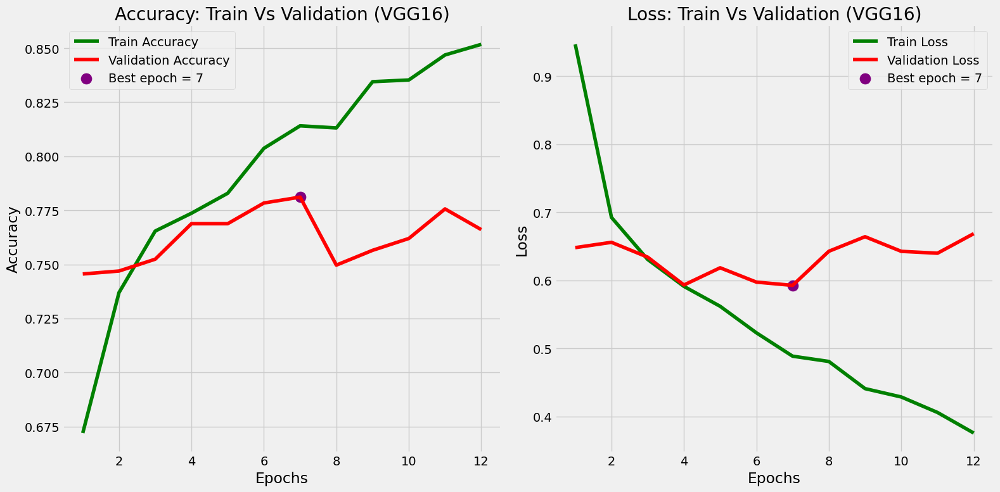

In [56]:
plot_training_history(history_vg,'VGG16')

In [57]:
loss, accuracy = model_vg.evaluate(test_ds)

print(f'Test Loss: {loss}')
print(f'Test Accuracy: {accuracy}')

12/12 ━━━━━━━━━━━━━━━━━━━━ 11s 989ms/step - accuracy: 0.7201 - loss: 0.7115
Test Loss: 0.6972774863243103
Test Accuracy: 0.7277777791023254


 2/12 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step

W0000 00:00:1712827280.670743     101 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


12/12 ━━━━━━━━━━━━━━━━━━━━ 3s 170ms/step


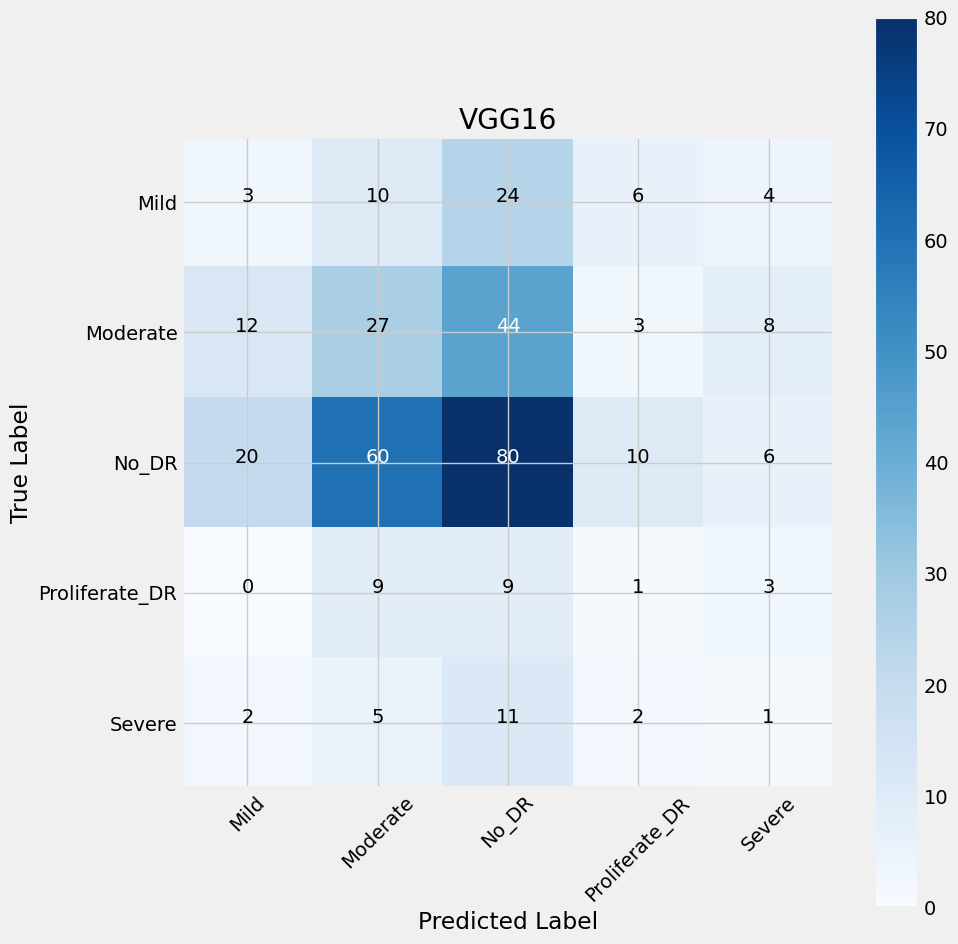

In [58]:
# Assuming you have trained your model and obtained predictions
preds = model_vg.predict(test_ds)  # Use predict method instead of predict_generator
y_pred = np.argmax(preds, axis=1)  # Convert probabilities to class labels
y_true = np.concatenate([label.numpy() for _, label in test_ds])
 # True labels from the generator
classes = class_names = test_ds.class_names # Get class names from the generator
report = classification_report(y_true, y_pred, target_names=classes)
print(report)
plot_confusion_matrix(y_pred,y_true,classes,'VGG16')

## **RESNET 50 MODEL**

In [2]:
model_rnn = prepare_model_ResNet50()
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

NameError: name 'prepare_model_ResNet50' is not defined

In [60]:
model_rnn.summary()

Model: "functional_17"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer_5[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 23,867,141 (91.05 MB)

 Trainable params: 279,429 (1.07 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

In [61]:
history_rnn=model_rnn.fit(
          train_ds,
          validation_data=val_ds,
          epochs=20,
          callbacks=[early_stop]
        )

Epoch 1/20
  2/160 ━━━━━━━━━━━━━━━━━━━━ 16s 107ms/step - accuracy: 0.2266 - loss: 1.6390

W0000 00:00:1712827325.709605     100 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


160/160 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - accuracy: 0.6457 - loss: 0.9743

W0000 00:00:1712827346.450641     100 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1712827350.392815     101 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1712827359.496072     100 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


160/160 ━━━━━━━━━━━━━━━━━━━━ 53s 214ms/step - accuracy: 0.6460 - loss: 0.9734 - val_accuracy: 0.7620 - val_loss: 0.6355
Epoch 2/20
160/160 ━━━━━━━━━━━━━━━━━━━━ 15s 93ms/step - accuracy: 0.7451 - loss: 0.6759 - val_accuracy: 0.7715 - val_loss: 0.5872
Epoch 3/20
160/160 ━━━━━━━━━━━━━━━━━━━━ 15s 93ms/step - accuracy: 0.7764 - loss: 0.6057 - val_accuracy: 0.7770 - val_loss: 0.5765
Epoch 4/20
160/160 ━━━━━━━━━━━━━━━━━━━━ 15s 92ms/step - accuracy: 0.7851 - loss: 0.5784 - val_accuracy: 0.7743 - val_loss: 0.5801
Epoch 5/20
160/160 ━━━━━━━━━━━━━━━━━━━━ 15s 92ms/step - accuracy: 0.7923 - loss: 0.5635 - val_accuracy: 0.7592 - val_loss: 0.6195
Epoch 6/20
160/160 ━━━━━━━━━━━━━━━━━━━━ 15s 92ms/step - accuracy: 0.7981 - loss: 0.5303 - val_accuracy: 0.7469 - val_loss: 0.6113
Epoch 7/20
160/160 ━━━━━━━━━━━━━━━━━━━━ 15s 92ms/step - accuracy: 0.7950 - loss: 0.5203 - val_accuracy: 0.7729 - val_loss: 0.6119
Epoch 8/20
160/160 ━━━━━━━━━━━━━━━━━━━━ 15s 92ms/step - accuracy: 0.8133 - loss: 0.4850 - val_accura

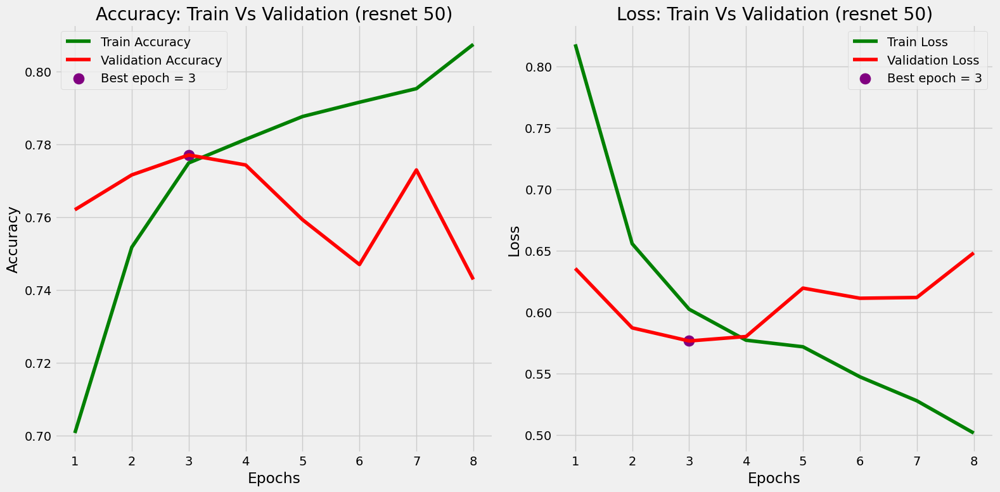

In [62]:
plot_training_history(history_rnn,'resnet 50')

In [63]:
loss, accuracy = model_rnn.evaluate(test_ds)

print(f'Test Loss: {loss}')
print(f'Test Accuracy: {accuracy}')

12/12 ━━━━━━━━━━━━━━━━━━━━ 6s 502ms/step - accuracy: 0.7355 - loss: 0.6895
Test Loss: 0.698087215423584
Test Accuracy: 0.75


W0000 00:00:1712827469.669081     101 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


In [1]:
# Assuming you have trained your model and obtained predictions
preds = model_rnn.predict(test_ds)  # Use predict method instead of predict_generator
y_pred = np.argmax(preds, axis=1)  # Convert probabilities to class labels
y_true = np.concatenate([label.numpy() for _, label in test_ds])
 # True labels from the generator
classes = class_names = test_ds.class_names # Get class names from the generator
report = classification_report(y_true, y_pred, target_names=classes)
print(report)
plot_confusion_matrix(y_pred,y_true,classes,'resnet 50')

NameError: name 'model_rnn' is not defined